In [1]:
%pip install pygraphviz

Note: you may need to restart the kernel to use updated packages.


In [2]:
%pip install torch_geometric

Note: you may need to restart the kernel to use updated packages.


In [3]:
from graph import Graph
from graph_nca import GraphNCA

In [4]:
NUM_OPERATIONS = 3
NUM_ACTIVATIONS = 2
NUM_HIDDEN_CHANNELS = 16

NUM_CHANNELS = GraphNCA.get_number_of_channels(NUM_OPERATIONS, NUM_ACTIVATIONS, NUM_HIDDEN_CHANNELS)

In [5]:
NUM_CHANNELS

23

tensor([[ 4.5010e+02,  2.5082e+02,  1.6230e+01, -4.2766e-01,  5.9524e-01,
         -6.3127e-02, -1.9842e+00, -1.7635e-01, -2.0837e+00,  1.2493e+00,
         -9.4742e-01, -3.7839e-01, -1.5724e+00, -1.6994e+00,  1.0143e+00,
         -5.2884e-01, -6.1865e-01, -7.8623e-01,  9.3340e-01, -2.3456e+00,
         -3.0198e-01,  1.3879e-01,  1.3239e-01],
        [ 3.2078e+02,  2.5145e+02,  1.4070e+01, -2.0343e-02, -9.9201e-01,
         -1.9974e-01,  9.8375e-01,  7.3434e-01,  1.5986e+00,  1.2157e+00,
          7.6231e-01,  1.3202e+00,  6.4848e-02,  8.9550e-01,  5.3702e-01,
          1.3011e+00,  1.2978e+00,  1.2569e+00,  9.0968e-01, -1.1144e+00,
         -7.3660e-01, -4.8781e-01,  6.2717e-01]])


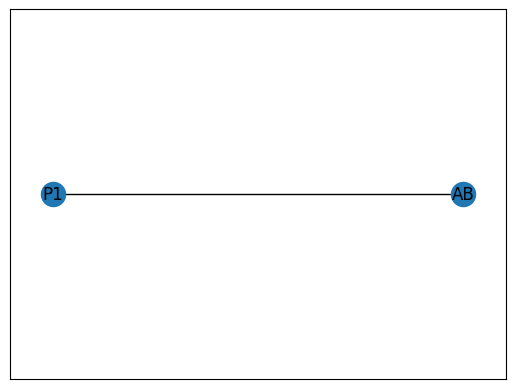

In [13]:
import torch
import numpy as np

x = torch.randn((2, NUM_CHANNELS))
x[0,0] = 450.10
x[0,1] = 250.82
x[0,2] = 16.23
x[1,0] = 320.78
x[1,1] = 251.45
x[1,2] = 14.07

edge_dict = {0:[1]}
label_dict = {0:"P1", 1:"AB"}

graph = Graph(x, edge_dict, label_dict)
image = graph.plot()    
print(graph.nodes)

In [14]:
import torch.distributions as td

def loss_fn(logits, actions, rewards):
    categorical = td.categorical.Categorical(logits=logits)
    log_probs = -categorical.log_prob(actions)
    return torch.sum(rewards*log_probs)

In [15]:
nca = GraphNCA(graph, NUM_HIDDEN_CHANNELS)
optimizer = torch.optim.Adam(nca.parameters(), lr=0.001)

In [16]:
list(nca.parameters())

[Parameter containing:
 tensor([[ 0.1489, -0.0777, -0.1422,  ...,  0.0152,  0.0319, -0.0414],
         [-0.0897, -0.1093, -0.2183,  ..., -0.0513, -0.2402, -0.0524],
         [-0.2322, -0.1551, -0.2257,  ..., -0.2269, -0.0073,  0.2291],
         ...,
         [-0.0602, -0.1628, -0.0144,  ...,  0.2003,  0.1979, -0.1730],
         [ 0.2398,  0.0412, -0.1408,  ...,  0.0039,  0.0705, -0.0015],
         [ 0.2186, -0.1315, -0.1158,  ..., -0.2186,  0.0626,  0.1658]],
        requires_grad=True),
 Parameter containing:
 tensor([[-1.1504e-01, -1.0508e-01,  2.1483e-02,  ...,  8.0851e-02,
           5.5626e-02,  4.8016e-02],
         [ 6.1464e-02, -1.0253e-01, -2.5279e-02,  ...,  6.6408e-02,
           2.4352e-02,  1.7001e-02],
         [ 1.2006e-01,  2.5450e-02, -5.3722e-02,  ..., -4.8945e-02,
          -2.8484e-02, -4.8537e-02],
         ...,
         [-5.4955e-02,  1.1910e-01, -3.6178e-02,  ..., -8.8195e-02,
          -6.6277e-02, -1.1738e-01],
         [-1.0690e-01, -9.9175e-02,  1.0152e-01,  

In [17]:
print(nca.graph.to_data())

Data(x=[2, 23], edge_index=[2, 1])


In [18]:
list(nca.parameters())

[Parameter containing:
 tensor([[ 0.1489, -0.0777, -0.1422,  ...,  0.0152,  0.0319, -0.0414],
         [-0.0897, -0.1093, -0.2183,  ..., -0.0513, -0.2402, -0.0524],
         [-0.2322, -0.1551, -0.2257,  ..., -0.2269, -0.0073,  0.2291],
         ...,
         [-0.0602, -0.1628, -0.0144,  ...,  0.2003,  0.1979, -0.1730],
         [ 0.2398,  0.0412, -0.1408,  ...,  0.0039,  0.0705, -0.0015],
         [ 0.2186, -0.1315, -0.1158,  ..., -0.2186,  0.0626,  0.1658]],
        requires_grad=True),
 Parameter containing:
 tensor([[-1.1504e-01, -1.0508e-01,  2.1483e-02,  ...,  8.0851e-02,
           5.5626e-02,  4.8016e-02],
         [ 6.1464e-02, -1.0253e-01, -2.5279e-02,  ...,  6.6408e-02,
           2.4352e-02,  1.7001e-02],
         [ 1.2006e-01,  2.5450e-02, -5.3722e-02,  ..., -4.8945e-02,
          -2.8484e-02, -4.8537e-02],
         ...,
         [-5.4955e-02,  1.1910e-01, -3.6178e-02,  ..., -8.8195e-02,
          -6.6277e-02, -1.1738e-01],
         [-1.0690e-01, -9.9175e-02,  1.0152e-01,  

In [19]:
from matplotlib import pyplot as plt
import pandas as pd

cells_data = pd.read_csv('Growing-GNN/parent_daughters.csv')

fig = plt.figure()

images = []
plt.text(0.1, 0.9, 'Time: Initial', transform=fig.transFigure, fontsize=12, color='red')
fig.canvas.draw()
images.append(np.array(fig.canvas.renderer.buffer_rgba()))
fig.clear()

for time_stamp in sorted(cells_data['Birth Time'].unique()):
    # Filter rows with the current birth time
    rows_at_time = cells_data[cells_data['Birth Time'] == time_stamp]
    
    # Iterate through these rows
    for _, row in rows_at_time.iterrows():
        if row['Parent'] not in graph.labels.values():
            continue
        parent = row['Parent']
        daughter1 = row['Daughter 1']
        daughter2 = row['Daughter 2']
        print(parent, daughter1, daughter2)
        parent_index = list(graph.labels.keys())[list(graph.labels.values()).index(parent)]
        print(parent_index)
        graph = nca.grow(graph, parent_index, [daughter1, daughter2])
    img = graph.plot(fig=fig)
    plt.text(0.1, 0.9, f'Time: {time_stamp}', transform=fig.transFigure, fontsize=12, color='red')
    fig.canvas.draw()
    images.append(np.array(fig.canvas.renderer.buffer_rgba()))
    fig.clear()

AB ABa ABp
1
1
labels {0: 'P1', 1: 'ABa', 2: 'ABp'}
tensor([[ 4.5010e+02,  2.5082e+02,  1.6230e+01, -4.2766e-01,  5.9524e-01,
         -6.3127e-02, -1.9842e+00, -1.7635e-01, -2.0837e+00,  1.2493e+00,
         -9.4742e-01, -3.7839e-01, -1.5724e+00, -1.6994e+00,  1.0143e+00,
         -5.2884e-01, -6.1865e-01, -7.8623e-01,  9.3340e-01, -2.3456e+00,
         -3.0198e-01,  1.3879e-01,  1.3239e-01],
        [ 1.7118e+00, -1.2401e+01, -2.6090e+00,  9.7576e+00, -3.0728e+01,
         -2.8310e+01, -2.6165e+01, -3.1304e+01,  3.0050e+00, -1.9731e+01,
          8.6192e+00, -1.1798e+01,  5.0023e+01, -2.7935e+01, -2.5163e+00,
         -6.3796e+00, -5.5141e+00, -3.4778e+01, -4.4969e+00,  1.4666e+01,
          2.7854e+01, -4.2348e+01,  3.4555e+01],
        [-2.4138e+01, -4.0519e+01, -8.8416e+00,  1.3899e+01,  1.5451e+00,
         -1.8681e+01,  1.5594e+01,  1.5585e+01, -1.0083e+01,  3.1643e+01,
          1.1194e+01,  1.4569e+00, -2.0358e+01, -2.6625e+00, -2.1802e+01,
          1.8630e+00, -5.9804e+00,  

<Figure size 640x480 with 0 Axes>

In [20]:
graph.nodes.size()

torch.Size([1070, 23])

In [21]:
from PIL import Image

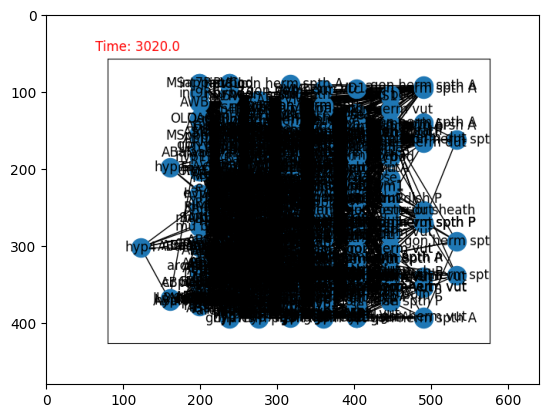

In [22]:
imgs = [Image.fromarray(img) for img in images]
plt.imshow(images[-1])

In [23]:
Image.fromarray(images[1]).save("next_step.png")
imgs[0].save("array2.gif", save_all=True, append_images=imgs[1:], duration=1000, loop=0)